In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import itertools
from itertools import chain

import warnings
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
warnings.filterwarnings('ignore') #ignore warning messages 

In [2]:
df = pd.read_csv('../data/breast-cancer-wisconsin-data_data.csv')
df = df.iloc[:,:-1] #drop last empty row

# Exploratory Data Analysis

In [18]:
df.head(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750


In [11]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


#### Replace target variable value to M->1, B->0

In [3]:
# Malignant to 1, benign to 0
df.diagnosis.replace(to_replace = dict(M = 1, B = 0), inplace = True)
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


### Balances of each class in the target variable & Visualization

# of Benign : 357 ( 0.6274165202108963 ) 
# of Malignant : 212 ( 0.37258347978910367 )


Text(0, 0.5, 'count')

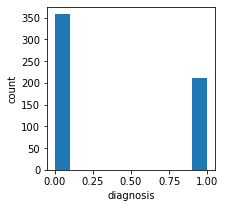

In [18]:
# B = benign, M = malignant
# HISTOGRAM-------------------
B, M = df['diagnosis'].value_counts()
print('# of Benign :',B,'(',B/(B+M),')','\n# of Malignant :',M,'(',M/(M+B),')')
plt.figure(figsize=(3,3))
plt.hist(df['diagnosis'])
plt.xlabel('diagnosis')
plt.ylabel('count')

In [4]:
# PERCENTAGE-------------------
trace = go.Pie(labels = ['benign','malignant'], values = df['diagnosis'].value_counts(), 
               textfont=dict(size=15), opacity = 0.8,
               marker=dict(colors=['lightskyblue', 'gold'], 
                           line=dict(color='#000000', width=0.5)))


layout = dict(title =  'Balance of diagnosis variable')
           
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

<img src="../figures/balance_target_variabe.png" align="left" width="800" height="600" />

### Get name of columns (mean/se/worst)

In [4]:
features = list(df)

features_mean = list(df.iloc[:,2:12])
features_se = list(df.iloc[:,12:22])
features_worst = list(df.iloc[:,22:32])

print('features_mean :',features_mean, '\nfeatures_se :',features_se, '\nfeatures_worst :',features_worst)

features_mean : ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean'] 
features_se : ['radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se'] 
features_worst : ['radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


### [Visualization]  Histogram of features_mean

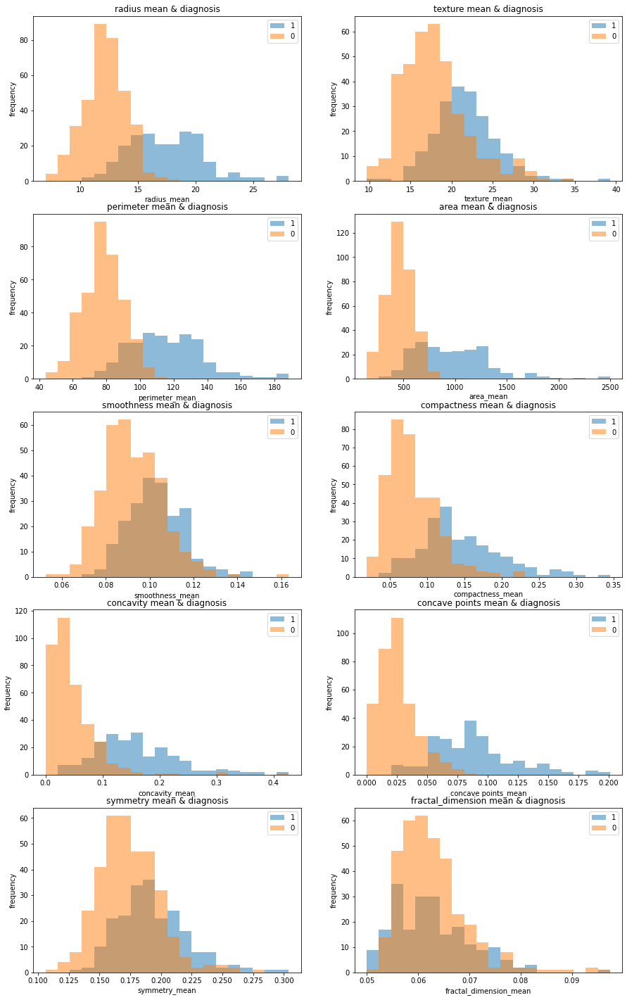

In [21]:
categories = df['diagnosis'].unique()

bin_range_rm = (df['radius_mean'].min(), df['radius_mean'].max())
bin_range_tm = (df['texture_mean'].min(), df['texture_mean'].max())
bin_range_pm = (df['perimeter_mean'].min(), df['perimeter_mean'].max())
bin_range_am = (df['area_mean'].min(), df['area_mean'].max())
bin_range_sm = (df['smoothness_mean'].min(), df['smoothness_mean'].max())
bin_range_cpm = (df['compactness_mean'].min(), df['compactness_mean'].max())
bin_range_ccm = (df['concavity_mean'].min(), df['concavity_mean'].max())
bin_range_ctm = (df['concave points_mean'].min(), df['concave points_mean'].max())
bin_range_sym = (df['symmetry_mean'].min(), df['symmetry_mean'].max())
bin_range_fm = (df['fractal_dimension_mean'].min(), df['fractal_dimension_mean'].max())

fig, axs = plt.subplots(5,2,figsize=(15,25))
#fig, axs = plt.subplots(3, 4)
for c in categories :
    axs[0,0].hist(df[df['diagnosis']==c]['radius_mean'], alpha=0.5, label=c, range=bin_range_rm, bins=20)
    axs[0,0].legend()
    axs[0,0].set(xlabel="radius_mean", ylabel="frequency", title='radius mean & diagnosis')

    axs[0,1].hist(df[df['diagnosis']==c]['texture_mean'], alpha=0.5, label=c, range=bin_range_tm, bins=20)
    axs[0,1].legend()
    axs[0,1].set(xlabel="texture_mean", ylabel="frequency", title='texture mean & diagnosis')
    
    axs[1,0].hist(df[df['diagnosis']==c]['perimeter_mean'], alpha=0.5, label=c, range=bin_range_pm, bins=20)
    axs[1,0].legend()
    axs[1,0].set(xlabel="perimeter_mean", ylabel="frequency", title='perimeter mean & diagnosis')
    
    axs[1,1].hist(df[df['diagnosis']==c]['area_mean'], alpha=0.5, label=c, range=bin_range_am, bins=20)
    axs[1,1].legend()
    axs[1,1].set(xlabel="area_mean", ylabel="frequency", title='area mean & diagnosis')
    
    axs[2,0].hist(df[df['diagnosis']==c]['smoothness_mean'], alpha=0.5, label=c, range=bin_range_sm, bins=20)
    axs[2,0].legend()
    axs[2,0].set(xlabel="smoothness_mean", ylabel="frequency", title='smoothness mean & diagnosis')
    
    axs[2,1].hist(df[df['diagnosis']==c]['compactness_mean'], alpha=0.5, label=c, range=bin_range_cpm, bins=20)
    axs[2,1].legend()
    axs[2,1].set(xlabel="compactness_mean", ylabel="frequency", title='compactness mean & diagnosis')
    
    axs[3,0].hist(df[df['diagnosis']==c]['concavity_mean'], alpha=0.5, label=c, range=bin_range_ccm, bins=20)
    axs[3,0].legend()
    axs[3,0].set(xlabel="concavity_mean", ylabel="frequency", title='concavity mean & diagnosis')
    
    axs[3,1].hist(df[df['diagnosis']==c]['concave points_mean'], alpha=0.5, label=c, range=bin_range_ctm, bins=20)
    axs[3,1].legend()
    axs[3,1].set(xlabel="concave points_mean", ylabel="frequency", title='concave points mean & diagnosis')
    
    axs[4,0].hist(df[df['diagnosis']==c]['symmetry_mean'], alpha=0.5, label=c, range=bin_range_sym, bins=20)
    axs[4,0].legend()
    axs[4,0].set(xlabel="symmetry_mean", ylabel="frequency", title='symmetry mean & diagnosis')
    
    axs[4,1].hist(df[df['diagnosis']==c]['fractal_dimension_mean'], alpha=0.5, label=c, range=bin_range_fm, bins=20)
    axs[4,1].legend()
    axs[4,1].set(xlabel="fractal_dimension_mean", ylabel="frequency", title='fractal_dimension mean & diagnosis')

plt.show()

###  [Visualization] Plot Distribution of features_mean

In [23]:
M = df[(df['diagnosis'] != 0)]
B = df[(df['diagnosis'] == 0)]

In [36]:
def plot_distribution(data_select, size_bin) :  
    tmp1 = M[data_select]
    tmp2 = B[data_select]
    hist_data = [tmp1, tmp2]
    
    group_labels = ['malignant', 'benign']
    colors = ['#FFD700', '#7EC0EE']

    fig = ff.create_distplot(hist_data, group_labels, colors = colors, show_hist = True, bin_size = size_bin, curve_type='kde')
    txt = 'Histogram & Distribution plot of ' + data_select
    fig['layout'].update(title = txt, xaxis=dict(title=data_select.split('_',1)[0]), yaxis=dict(title="frequency"))

    py.iplot(fig, filename = 'Density plot')

In [37]:
plot_distribution('radius_mean', .5)
plot_distribution('texture_mean', .5)
plot_distribution('perimeter_mean', 3)
plot_distribution('area_mean', 30)
plot_distribution('smoothness_mean', .002)
plot_distribution('compactness_mean', .005)
plot_distribution('concavity_mean', .005)
plot_distribution('concave points_mean', .002)
plot_distribution('symmetry_mean', .005)
plot_distribution('fractal_dimension_mean', .001)


<img src="../figures/hist_dist_radius_mean.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_texture_mean.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_perimeter_mean.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_area_mean.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_smoothness_mean.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_compactness_mean.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_concavity_mean.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_concavepoints_mean.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_symmetry_mean.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_fractaldimension_mean.png" align="left" width="800" height="600" />

###  [Visualization] Violin plot of features_mean

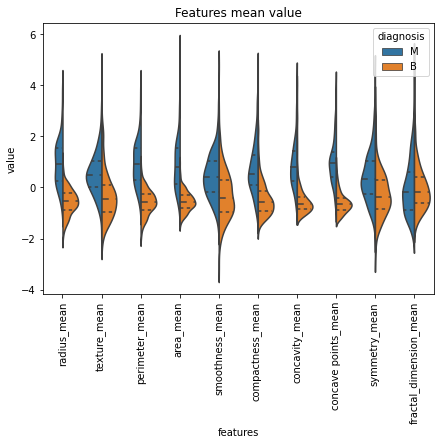

In [51]:
import seaborn as sns
y = df['diagnosis']
data_dia = y
data = df.iloc[:,2:]
data_n_2 = (data - data.mean()) / (data.std())              # standardization
data = pd.concat([y,data_n_2.iloc[:,0:10]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(7,5))
sns.violinplot(x="features", y="value", hue="diagnosis", data=data,split=True, inner="quart")
plt.xticks(rotation=90)
plt.title('Features mean value')
plt.show()

### [Visualization] Distribution plot of standard error data

In [34]:
plot_distribution('radius_se', .05)
plot_distribution('texture_se', .1)
plot_distribution('perimeter_se', 0.5)
plot_distribution('area_se', 10)
plot_distribution('smoothness_se', .0005)
plot_distribution('compactness_se', .002)
plot_distribution('concavity_se', .005)
plot_distribution('concave points_se', .001)
plot_distribution('symmetry_se', .001)
plot_distribution('fractal_dimension_se', .0005)


<img src="../figures/hist_dist_radius_se.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_texture_se.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_perimeter_se.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_area_se.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_smoothness_se.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_compactness_se.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_concavity_se.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_concavepoints_se.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_symmetry_se.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_fractaldimension_se.png" align="left" width="800" height="600" />

### [Visualization] Violin plot of standard error data

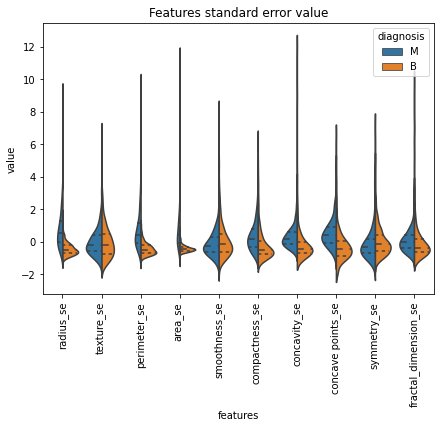

In [54]:
data = pd.concat([y,data_n_2.iloc[:,10:20]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(7,5))
sns.violinplot(x="features", y="value", hue="diagnosis", data=data,split=True, inner="quart")
plt.xticks(rotation=90)
plt.title('Features standard error value')
plt.show()

### [Visualization] Distribution plot of worst features data

In [35]:
plot_distribution('radius_worst', .5)
plot_distribution('texture_worst', .5)
plot_distribution('perimeter_worst', 5)
plot_distribution('area_worst', 30)
plot_distribution('smoothness_worst', .005)
plot_distribution('compactness_worst', .01)
plot_distribution('concavity_worst', .01)
plot_distribution('concave points_worst', .005)
plot_distribution('symmetry_worst', .01)
plot_distribution('fractal_dimension_worst', .005)

<img src="../figures/hist_dist_radius_worst.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_texture_worst.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_perimeter_worst.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_area_worst.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_smoothness_worst.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_compactness_worst.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_concavity_worst.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_concavepoints_worst.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_symmetry_worst.png" align="left" width="800" height="600" />
<img src="../figures/hist_dist_fractaldimension_worst.png" align="left" width="800" height="600" />

### [Visualization] Violin plot of standard error data

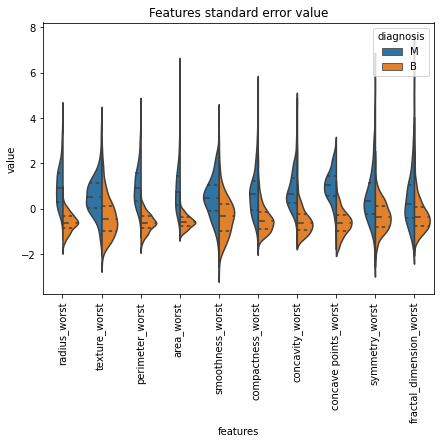

In [55]:
# Second ten features
data = pd.concat([y,data_n_2.iloc[:,20:31]],axis=1)
data = pd.melt(data,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(7,5))
sns.violinplot(x="features", y="value", hue="diagnosis", data=data,split=True, inner="quart")
plt.xticks(rotation=90)
plt.title('Features worst value')
plt.show()

### [Visualization] Heatmap of features_mean, standard error, worst

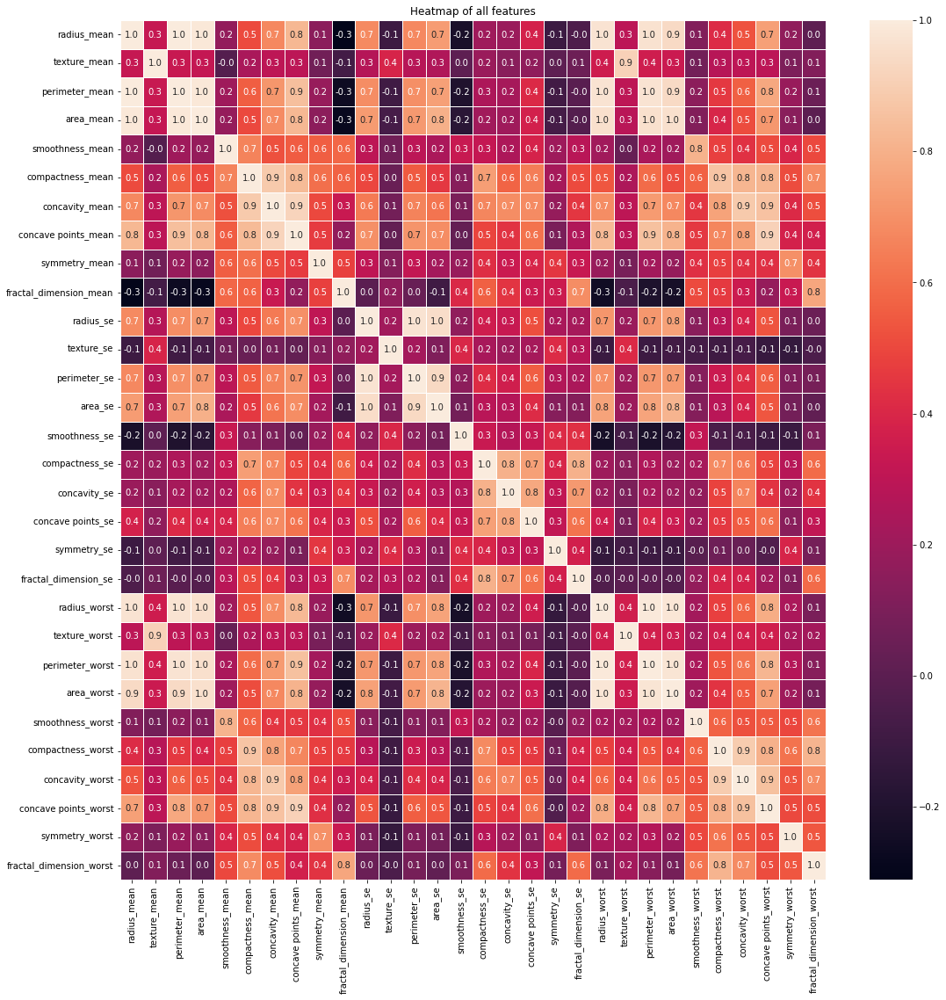

In [57]:
import seaborn as sns

x = df.iloc[:,2:]
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(x.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
ax.set_title('Heatmap of all features')


### [Visualization] Heatmap of features_mean

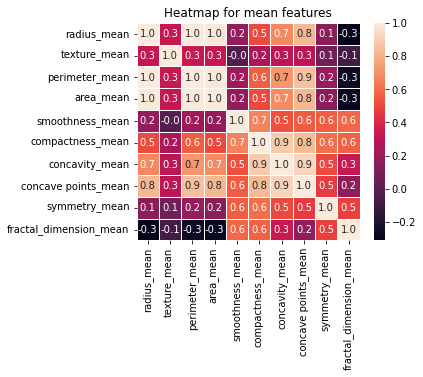

In [58]:
x = df.iloc[:,2:12]
f,ax = plt.subplots(figsize=(5,4))
sns.heatmap(x.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
ax.set_title('Heatmap for mean features')

### [Visualization] Heatmap of standard error

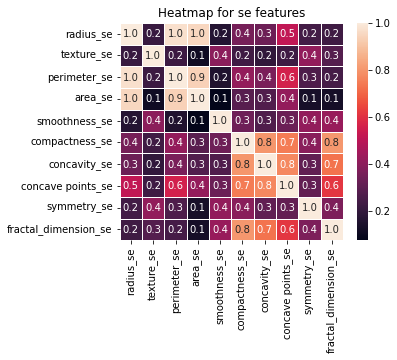

In [59]:
x = df.iloc[:,12:22]
f,ax = plt.subplots(figsize=(5,4))
sns.heatmap(x.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
ax.set_title('Heatmap for se features')

### [Visualization] Heatmap of worst features

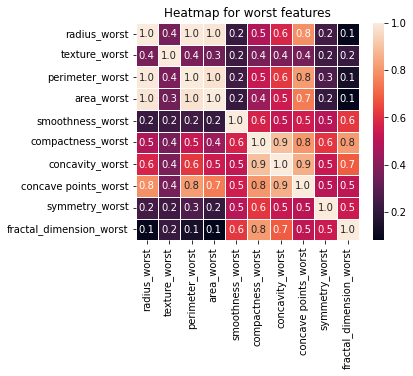

In [60]:
x = df.iloc[:,22:32]
f,ax = plt.subplots(figsize=(5,4))
sns.heatmap(x.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
ax.set_title('Heatmap for worst features')


## Models

In [21]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

from sklearn.model_selection import ParameterGrid
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import xgboost

import warnings
warnings.filterwarnings("ignore")

#### Baseline accuracy score

In [98]:
B, M = df['diagnosis'].value_counts()
baseline_accuracy = B/(B+M)
print('baseline accuracy score is', baseline_accuracy)

baseline accuracy score is 0.6274165202108963


### Logistic Regression model

In [357]:
from sklearn.linear_model import LogisticRegression

lr_CV_scores = []
lr_test_scores = []
lr_models = []
lr_train_sets = []
lr_test_sets = []
std_ftrs = list(X)

preprocessor = ColumnTransformer(
    transformers=[
        ('std', StandardScaler(), std_ftrs)])

param_grid = {
    'logisticregression__C': [100, 10, 1.0, 0.1, 0.01]
}

# add your code below
for i in range(5):
    X_other, X_test, y_other, y_test = train_test_split(X, y, test_size=0.2, random_state=42*i)
    kf = KFold(n_splits=10, random_state=42*i, shuffle=True)
    
    pipe = make_pipeline(preprocessor,LogisticRegression())

    grid = GridSearchCV(pipe, param_grid, scoring = 'accuracy', cv=kf)
    grid.fit(X_other, y_other)
    
    lr_CV_scores.append(grid.best_score_) # this is the mean validation score over all iterations
    y_test_pred = grid.predict(X_test)
    lr_test_scores.append(accuracy_score(y_test, y_test_pred))
    lr_models.append(grid.best_estimator_)
    
    lr_test_sets.append([X_test, y_test])

print('CV accuracy mean:',np.mean(lr_CV_scores))
print('test accuracy mean:',np.mean(lr_test_scores))
print('test accuracy standard deviation:',np.std(lr_test_scores))

CV accuracy mean: 0.9753816425120773
test accuracy mean: 0.9771929824561404
test accuracy standard deviation: 0.008945648269461006


In [121]:
print('Maximum validation score difference :', max(lr_CV_scores)-min(lr_CV_scores))
print('Maximum test score difference :', max(lr_test_scores)-min(lr_test_scores))

Maximum validation score difference : 0.0045410628019322274
Maximum test score difference : 0.02631578947368418


In [128]:
print(round((np.mean(lr_test_scores)-baseline_accuracy)/np.std(lr_test_scores),4),'standard deviations above the baseline')

39.1002 standard deviations above the baseline


### Decision tree model

In [355]:
from sklearn.tree import DecisionTreeClassifier
y = df['diagnosis'] 
X = df.iloc[:, 2:] 

#Collect the test scores, test sets, and the best models in lists. 
dt_models = []
dt_CV_scores = []
dt_test_scores = []
dt_test_sets = []
std_ftrs = list(X)

preprocessor = ColumnTransformer(
    transformers=[
        ('std', StandardScaler(), std_ftrs)])

# Decision tree parameter grid
param_grid = {
    'decisiontreeclassifier__max_depth': [3,4,5,6,8,9]
}

for i in range(5) :
    #Split
    X_other, X_test, y_other, y_test = train_test_split(X, y, test_size=0.2, random_state=42*i)
    kf = KFold(n_splits=10, random_state=42*i, shuffle=True)

    #model
    pipe = make_pipeline(preprocessor,DecisionTreeClassifier(random_state=42*i))

    grid = GridSearchCV(pipe, param_grid, scoring = 'accuracy', cv=kf)
    grid.fit(X_other, y_other)
    
    dt_CV_scores.append(grid.best_score_) # this is the mean validation score over all iterations
    y_test_pred = grid.predict(X_test)
    dt_test_scores.append(accuracy_score(y_test, y_test_pred))
    dt_models.append(grid.best_estimator_)
    dt_test_sets.append([X_test, y_test])

#What's the mean and standard deviation of the test accuracy?
print('CV accuracy mean:',np.mean(dt_CV_scores))
print('test accuracy mean:',np.mean(dt_test_scores))
print('test accuracy standard deviation:',np.std(dt_test_scores))

CV accuracy mean: 0.9292173913043479
test accuracy mean: 0.9298245614035088
test accuracy standard deviation: 0.018400155231055274


In [122]:
print('Maximum validation score difference :', max(dt_CV_scores)-min(dt_CV_scores))
print('Maximum test score difference :', max(dt_test_scores)-min(dt_test_scores))

Maximum validation score difference : 0.021980676328502424
Maximum test score difference : 0.04385964912280693


In [129]:
print(round((np.mean(dt_test_scores)-baseline_accuracy)/np.std(dt_test_scores),4),'standard deviations above the baseline')

16.4351 standard deviations above the baseline


### KNN model

In [113]:
from sklearn.neighbors import KNeighborsClassifier

y = df['diagnosis'] 
X = df.iloc[:, 2:] 

#Collect the test scores, test sets, and the best models in lists. 
knn_models = []
knn_CV_scores = []
knn_test_scores = []
knn_test_sets = []
std_ftrs = list(X)

preprocessor = ColumnTransformer(
    transformers=[
        ('std', StandardScaler(), std_ftrs)])

# KNN parameter grid
param_grid = {
    'kneighborsclassifier__n_neighbors': [1, 5, 10, 20, 30, 100]
}

for i in range(5) :
    #Split
    X_other, X_test, y_other, y_test = train_test_split(X, y, test_size=0.2, random_state=42*i)
    kf = KFold(n_splits=10, random_state=42*i, shuffle=True)
    
    #model
    pipe = make_pipeline(preprocessor,KNeighborsClassifier())

    grid = GridSearchCV(pipe, param_grid, scoring = 'accuracy', cv=kf)
    grid.fit(X_other, y_other)
    
    knn_CV_scores.append(grid.best_score_) # this is the mean validation score over all iterations
    y_test_pred = grid.predict(X_test)
    knn_test_scores.append(accuracy_score(y_test, y_test_pred))
    knn_models.append(grid.best_estimator_)
    knn_test_sets.append([X_test, y_test])

#What's the mean and standard deviation of the test accuracy?
print('CV accuracy mean:',np.mean(knn_CV_scores))
print('test accuracy mean:',np.mean(knn_test_scores))
print('test accuracy standard deviation:',np.std(knn_test_scores))

CV accuracy mean: 0.9660772946859904
test accuracy mean: 0.9596491228070176
test accuracy standard deviation: 0.008945648269461055


In [123]:
print('Maximum validation score difference :', max(knn_CV_scores)-min(knn_CV_scores))
print('Maximum test score difference :', max(knn_test_scores)-min(knn_test_scores))

Maximum validation score difference : 0.00236714975845409
Maximum test score difference : 0.026315789473684292


In [130]:
print(round((np.mean(knn_test_scores)-baseline_accuracy)/np.std(knn_test_scores),4),'standard deviations above the baseline')

37.139 standard deviations above the baseline


### SVM model

In [114]:
from sklearn.svm import SVC

y = df['diagnosis'] 
X = df.iloc[:, 2:] 

#Collect the test scores, test sets, and the best models in lists. 
svm_models = []
svm_CV_scores = []
svm_test_scores = []
svm_test_sets = []
std_ftrs = list(X)

preprocessor = ColumnTransformer(
    transformers=[
        ('std', StandardScaler(), std_ftrs)])

# SVC parameter grid
param_grid = {
    'svc__gamma': [1e-3, 1e-1, 1e1, 1e3, 1e5],
    'svc__C': [1e-1, 1e0, 1e1]
}

for i in range(5) :
    #Split
    X_other, X_test, y_other, y_test = train_test_split(X, y, test_size=0.2, random_state=42*i)
    kf = KFold(n_splits=10, random_state=42*i, shuffle=True)
    
    #model
    pipe = make_pipeline(preprocessor,SVC(probability=True))

    grid = GridSearchCV(pipe, param_grid, scoring = 'accuracy', cv=kf)
    grid.fit(X_other, y_other)
    
    svm_CV_scores.append(grid.best_score_) # this is the mean validation score over all iterations
    y_test_pred = grid.predict(X_test)
    svm_test_scores.append(accuracy_score(y_test, y_test_pred))
    svm_models.append(grid.best_estimator_)
    knn_test_sets.append([X_test, y_test])

#What's the mean and standard deviation of the test accuracy?
print('CV accuracy mean:',np.mean(svm_CV_scores))
print('test accuracy mean:',np.mean(svm_test_scores))
print('test accuracy standard deviation:',np.std(svm_test_scores))

CV accuracy mean: 0.9683285024154589
test accuracy mean: 0.9754385964912281
test accuracy standard deviation: 0.012892051277806191


In [124]:
print('Maximum validation score difference :', max(svm_CV_scores)-min(svm_CV_scores))
print('Maximum test score difference :', max(svm_test_scores)-min(svm_test_scores))

Maximum validation score difference : 0.013236714975845332
Maximum test score difference : 0.03508771929824561


In [131]:
print(round((np.mean(svm_test_scores)-baseline_accuracy)/np.std(svm_test_scores),4),'standard deviations above the baseline')

26.9951 standard deviations above the baseline


### XGBoost model

In [364]:
y = df['diagnosis'] 
X = df.iloc[:, 2:] 

#Tune at least one XGBoost hyperparameter and use early stopping.
param_grid = {"learning_rate": [0.03],
              "n_estimators": [10000],
              "seed": [0],
              "reg_alpha": [0e0, 1e-2, 1e-1, 1e0, 1e1, 1e2],
              #"reg_lambda": [0e0, 1e-2, 1e-1, 1e0, 1e1, 1e2],
              "missing": [np.nan], 
              "max_depth": [1,3,10,30,100],
              "colsample_bytree": [0.9],              
              "subsample": [0.66]}

#Collect the test scores, test sets, and the best models in lists. 
xgb_models = []
xgb_CV_scores = []
xgb_test_scores = []
xgb_test_sets = []
std_ftrs = list(X)

preprocessor = ColumnTransformer(
    transformers=[
        ('std', StandardScaler(), std_ftrs)])

#Train 5 XGBoost models using 5 different random states. 
for i in range(5) :
    #Split
    X_train, X_other, y_train, y_other = train_test_split(X, y, train_size=0.6, random_state=42*i)
    X_test, X_val, y_test, y_val = train_test_split(X_other, y_other, test_size=0.5, random_state=42*i)
    
    #preprocess
    X_train_prep = preprocessor.fit_transform(X_train)
    X_val_prep = preprocessor.transform(X_val)
    X_test_prep = preprocessor.transform(X_test)
    
    #model
    XGB = xgboost.XGBClassifier(seed = 42*i, eval_metric = 'logloss')
    grid = GridSearchCV(XGB, param_grid, scoring = 'accuracy')
    grid.fit(X_train_prep, y_train,early_stopping_rounds=100,eval_set=[(X_val_prep, y_val)], verbose=False)
    
    #scores
    xgb_CV_scores.append(grid.best_score_) # this is the mean validation score over all iterations
    y_test_pred = grid.predict(X_test_prep)
    xgb_test_scores.append(accuracy_score(y_test, y_test_pred))
    xgb_models.append(grid.best_estimator_)
    xgb_test_sets.append([X_test, y_test])


test accuracy mean: 0.9595140664961639
test accuracy mean: 0.9631578947368421
test accuracy standard deviation: 0.012892051277806207


In [371]:
#The mean and standard deviation of the test accuracy?
print('Validation accuracy mean:',np.mean(xgb_CV_scores)) # use this to figure which ML algorithm is the best algorithm.
print('test accuracy mean:',np.mean(xgb_test_scores)) # use this to figure which ML algorithm is the best algorithm.
print('test accuracy standard deviation:',np.std(xgb_test_scores))

Validation accuracy mean: 0.9595140664961639
test accuracy mean: 0.9631578947368421
test accuracy standard deviation: 0.012892051277806207


In [365]:
print('Maximum validation score difference :', max(xgb_CV_scores)-min(xgb_CV_scores))
print('Maximum test score difference :', max(xgb_test_scores)-min(xgb_test_scores))

Maximum validation score difference : 0.008780903665814077
Maximum test score difference : 0.03508771929824561


In [366]:
print(round((np.mean(xgb_test_scores)-baseline_accuracy)/np.std(xgb_test_scores),4),'standard deviations above the baseline')

26.0425 standard deviations above the baseline


### Model Test Score difference 

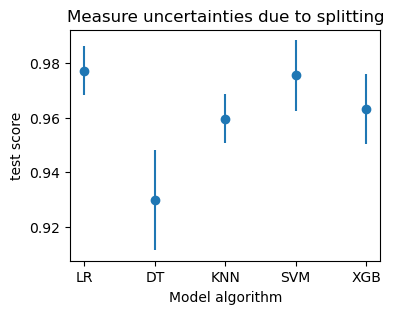

In [423]:
# Measure uncertainties due to splitting
import matplotlib.pylab as plt
model_means = [np.mean(lr_test_scores),np.mean(dt_test_scores),np.mean(knn_test_scores), \
               np.mean(svm_test_scores),np.mean(xgb_test_scores)]
model_strs = [np.std(lr_test_scores),np.std(dt_test_scores),np.std(knn_test_scores), \
               np.std(svm_test_scores),np.std(xgb_test_scores)]
plt.figure(figsize=(4,3))
plt.errorbar(['LR','DT','KNN','SVM','XGB'], model_means, yerr=model_strs, fmt='o')
plt.title('Measure uncertainties due to splitting')
plt.xlabel('Model algorithm')
plt.ylabel('test score')
plt.show()

In [380]:
xgb_test_scores #represent this using the mean standard plot ?

[0.9736842105263158,
 0.9824561403508771,
 0.956140350877193,
 0.956140350877193,
 0.9473684210526315]

In [381]:
#Get the best XGBoost model
best_index = xgb_test_scores.index(max(xgb_test_scores))
print(best_index)
best_model = xgb_models[best_index]
print(best_model)

1
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.9,
              enable_categorical=False, eval_metric='logloss', gamma=0,
              gpu_id=-1, importance_type=None, interaction_constraints='',
              learning_rate=0.03, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=10000, n_jobs=8, num_parallel_tree=1,
              predictor='auto', random_state=0, reg_alpha=0.0, reg_lambda=1,
              scale_pos_weight=1, seed=0, subsample=0.66, tree_method='exact',
              validate_parameters=1, verbosity=None)


In [386]:
# when computing the global, local feature importance 
df_test = preprocessor.transform(xgb_test_sets[best_index][0])
df_test = pd.DataFrame(data=df_test,columns = preprocessor.get_feature_names_out())
df_test.head()


,std__radius_mean,std__texture_mean,std__perimeter_mean,std__area_mean,std__smoothness_mean,std__compactness_mean,std__concavity_mean,std__concave points_mean,std__symmetry_mean,std__fractal_dimension_mean,...,std__radius_worst,std__texture_worst,std__perimeter_worst,std__area_worst,std__smoothness_worst,std__compactness_worst,std__concavity_worst,std__concave points_worst,std__symmetry_worst,std__fractal_dimension_worst
0,1.513141,0.437170,1.498236,1.471179,0.886415,1.018524,1.317129,1.966041,0.893925,-0.388791,...,1.478320,-0.029168,1.320789,1.415208,0.512950,1.049908,0.852237,1.974242,1.121742,0.185473
1,2.040757,0.676765,2.071914,2.026974,1.379119,1.932642,2.346905,2.680066,1.232239,0.444557,...,2.021118,0.501724,1.894079,2.057238,0.770900,1.968657,2.078355,1.961927,1.466622,0.880820
2,-0.583580,-0.109480,-0.626763,-0.593166,-0.899810,-0.891384,-1.021917,-1.046791,-0.975897,-0.321519,...,-0.547989,0.223874,-0.618400,-0.563349,-0.176399,-0.755758,-1.097525,-0.982643,-0.054054,-0.172270
3,0.529358,-0.307204,0.506251,0.408628,0.026612,0.153109,0.049248,0.238504,0.137265,-0.046940,...,0.733504,-0.072169,0.629902,0.593686,-0.065214,-0.204010,0.033543,0.105310,-0.195214,-0.132521
4,-0.138405,-0.707305,-0.184553,-0.238437,-0.281501,-0.617710,-0.898615,-0.786614,-0.699426,-0.174620,...,-0.097018,-0.910680,-0.175644,-0.199532,-0.287585,-0.623438,-0.734163,-0.426736,-0.172757,-0.331797


### Global Feature Importance - Permutation Importance

In [390]:
# Permutation

import numpy as np
import matplotlib.pylab as plt
import warnings
warnings.filterwarnings("ignore")

np.random.seed(42)

nr_runs = 10
scores = np.zeros([len(list(X)),nr_runs])
for i in range(len(preprocessor.get_feature_names_out())):
    print('shuffling '+str(preprocessor.get_feature_names_out()[i]))
    acc_scores = []
    for j in range(nr_runs):
        X_test_shuffled = df_test.copy()
        X_test_shuffled[preprocessor.get_feature_names_out()[i]] = np.random.permutation(df_test[preprocessor.get_feature_names_out()[i]].values)
        acc_scores.append(best_model.score(X_test_shuffled,xgb_test_sets[best_index][1]))
    print('   shuffled test score:',np.around(np.mean(acc_scores),3),'+/-',np.around(np.std(acc_scores),3))
    scores[i] = acc_scores

shuffling std__radius_mean
   shuffled test score: 0.982 +/- 0.0
shuffling std__texture_mean
   shuffled test score: 0.969 +/- 0.007
shuffling std__perimeter_mean
   shuffled test score: 0.982 +/- 0.0
shuffling std__area_mean
   shuffled test score: 0.982 +/- 0.0
shuffling std__smoothness_mean
   shuffled test score: 0.982 +/- 0.0
shuffling std__compactness_mean
   shuffled test score: 0.982 +/- 0.003
shuffling std__concavity_mean
   shuffled test score: 0.979 +/- 0.004
shuffling std__concave points_mean
   shuffled test score: 0.984 +/- 0.007
shuffling std__symmetry_mean
   shuffled test score: 0.982 +/- 0.0
shuffling std__fractal_dimension_mean
   shuffled test score: 0.982 +/- 0.0
shuffling std__radius_se
   shuffled test score: 0.982 +/- 0.0
shuffling std__texture_se
   shuffled test score: 0.982 +/- 0.0
shuffling std__perimeter_se
   shuffled test score: 0.982 +/- 0.0
shuffling std__area_se
   shuffled test score: 0.976 +/- 0.004
shuffling std__smoothness_se
   shuffled test score

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 1000x1000 with 0 Axes>

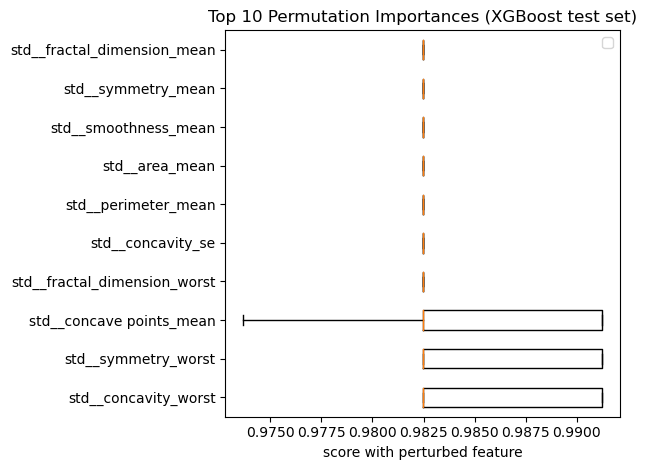

In [410]:
sorted_indcs = np.argsort(np.mean(scores,axis=1))[::-1]
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 10})
plt.figure(figsize=(6.4,4.8))
plt.boxplot(scores[sorted_indcs][0:10].T,labels=preprocessor.get_feature_names_out()[sorted_indcs][0:10],vert=False)
# plt.axvline(baseline_accuracy,label='test score')
plt.title("Top 10 Permutation Importances (XGBoost test set)")
plt.xlabel('score with perturbed feature')
plt.legend() 
plt.tight_layout()
plt.savefig('../figures/xgb_permutation_importances.png',dpi=300)
plt.show()

### Global Feature Importance - Tree based importance

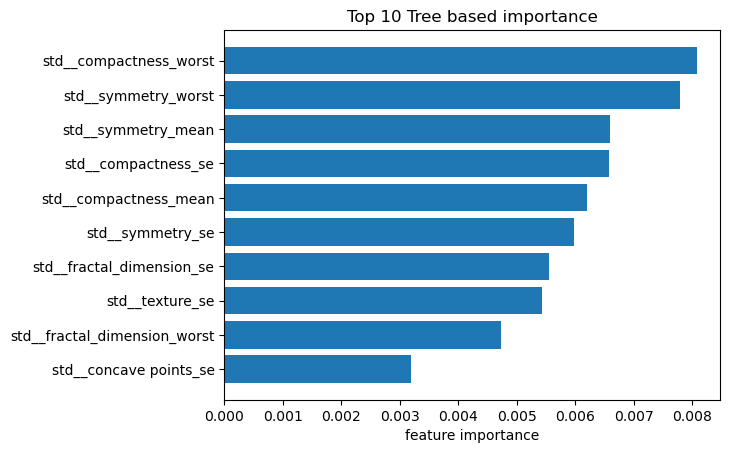

In [418]:
fi = np.argsort(best_model.feature_importances_)
plt.barh(range(len(fi))[0:10], best_model.feature_importances_[fi][0:10])
plt.xlabel('feature importance')
plt.yticks(range(len(fi))[0:10], np.array(df_test.columns)[fi][0:10])
plt.title('Top 10 Tree based importance')
plt.savefig('../figures/xgb_feature_importances.png',dpi=300)
plt.show()

### Global Feature Importance -  Shap value

(114, 30)


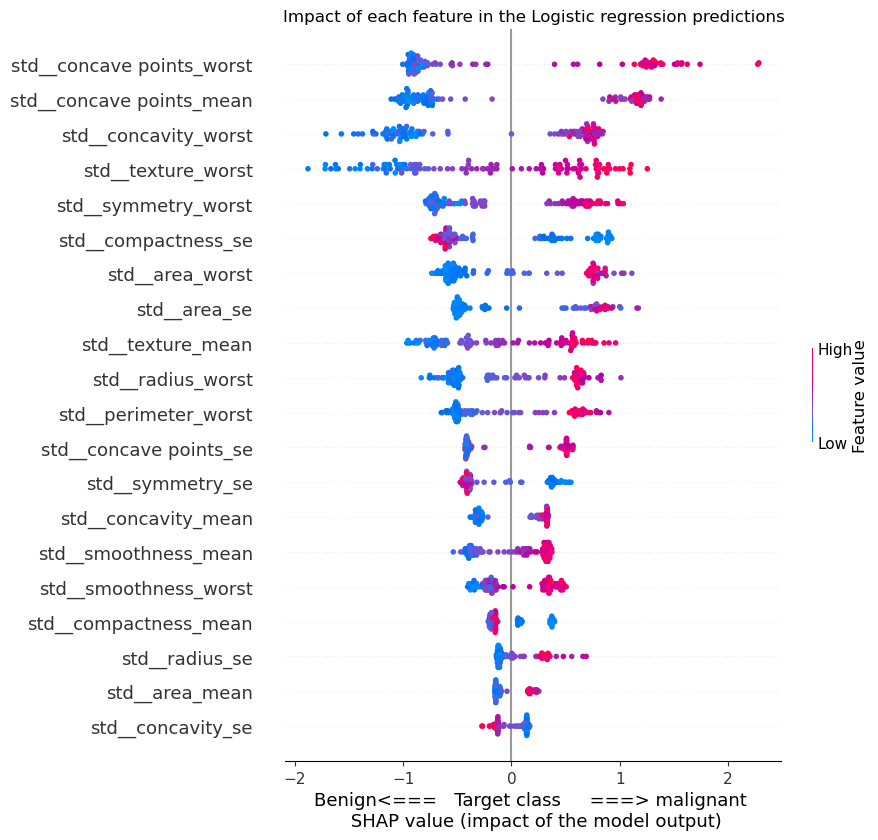

In [439]:
import shap
explainer = shap.TreeExplainer(best_model)
#print(best_model)
shap_values = explainer.shap_values(df_test)
# print(shap_values[:,0])
print(shap_values.shape)

shap.summary_plot(shap_values, df_test, show=False)
fig = plt.gcf()
ax = plt.gca()
ax.set_xlabel("Benign<===   Target class     ===> malignant \n SHAP value (impact of the model output)")
ax.set_title("Impact of each feature in the Logistic regression predictions")
plt.savefig('../figures/xgb_shap_value.png',dpi=300)
plt.show()

### SHAP values for local feature importance

In [459]:
# index = 0
print()
shap.initjs()
index = 0 # the index of the point to explain
shap.force_plot(explainer.expected_value, shap_values[index,:], features = df_test.iloc[index,:],show=False)


<img src="../figures/xgb_local_shap_0.png" align="left" width="800" height="600" />

In [462]:
print('Index 0 is malignant')

Index 0 is malignant


In [463]:
# index = 0
print()
shap.initjs()
index = 50 # the index of the point to explain
shap.force_plot(explainer.expected_value, shap_values[index,:], features = df_test.iloc[index,:])

<img src="../figures/xgb_local_shap_50.png" align="left" width="800" height="600" />

In [465]:
print('Index 50 is benign')

Index 50 is benign
